In [1]:
import pandas as pd
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)

In [2]:
df = pd.read_csv('data.csv')

In [3]:
df.head()

,bird_id,bird_model_id,start_odometer,end_odometer,start_timestamp,end_timestamp,rider_id,rider_age,ride_rating,ride_neighborhood,ride_triggered_maintenance
0,147,1,0.0,5.90,1522593472,1522595344,65,28,1,pasadena,False
1,121,1,0.0,29.33,1522598723,1522605721,43,36,4,west hollywood,False
2,367,1,0.0,17.45,1522629261,1522631447,67,38,5,culver city,True
3,243,1,0.0,26.67,1522591864,1522602578,89,24,4,venice,False
4,302,1,0.0,30.52,1522576415,1522581535,29,54,5,culver city,True


# Data Clean

In [4]:
# # switch to time
# df['start_time'] = pd.to_datetime(df.start_timestamp,unit='s')
# df['end_time'] = pd.to_datetime(df.end_timestamp,unit='s')

In [5]:
# create new columns
df['trip_distance'] = df.end_odometer-df.start_odometer
df['trip_duration'] = df.end_timestamp-df.start_timestamp
df['trip_speed'] = df.trip_distance/df.trip_duration

df['total_distance'] = df.end_odometer
df['total_duration'] = df.groupby('bird_id').trip_duration.cumsum()

df['num'] = 1
df['num_rides'] = df.groupby('bird_id').num.cumsum()

df['fix'] = df.ride_triggered_maintenance.apply(lambda x: 1 if x == True else 0)

In [6]:
df = df.drop(['ride_triggered_maintenance','num','bird_id','rider_id'],axis =1)
df = df.drop(['start_odometer', 'end_odometer','start_timestamp', 'end_timestamp'],axis =1)

In [7]:
# start_end and end_odometer is calculated in total_distance
# start_timestamp and end_timestamp is incldued in total duration

In [8]:
df.columns

Index(['bird_model_id', 'rider_age', 'ride_rating', 'ride_neighborhood',
       'trip_distance', 'trip_duration', 'trip_speed', 'total_distance',
       'total_duration', 'num_rides', 'fix'],
      dtype='object')

In [9]:
df.head()

,bird_model_id,rider_age,ride_rating,ride_neighborhood,trip_distance,trip_duration,trip_speed,total_distance,total_duration,num_rides,fix
0,1,28,1,pasadena,5.90,1872,0.003152,5.90,1872,1,0
1,1,36,4,west hollywood,29.33,6998,0.004191,29.33,6998,1,0
2,1,38,5,culver city,17.45,2186,0.007983,17.45,2186,1,1
3,1,24,4,venice,26.67,10714,0.002489,26.67,10714,1,0
4,1,54,5,culver city,30.52,5120,0.005961,30.52,5120,1,1


# EDA

# Correlation

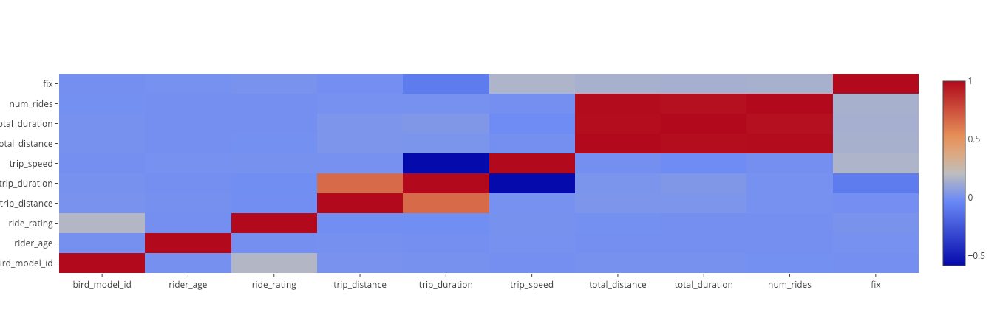

In [10]:
# correlation matrix
c = df.corr()
trace = go.Heatmap(z=c.values,
                   x=c.columns,
                   y=c.index)
data=[trace]
fig = go.Figure(data)
py.iplot(fig)

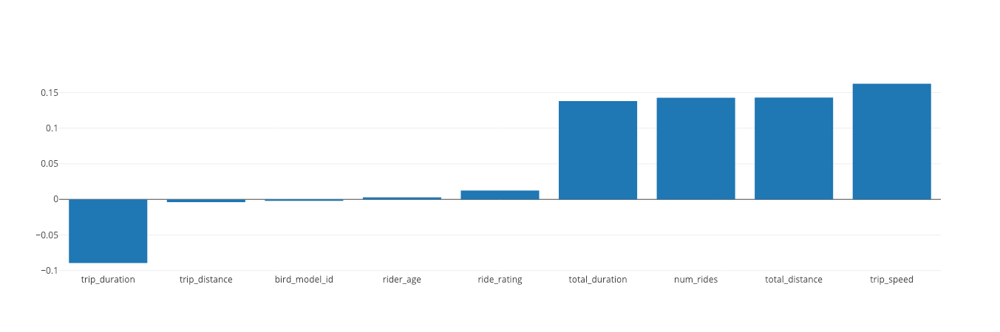

In [11]:
# correlation against fix column 
c2 = pd.DataFrame(df.corr()['fix']).sort_values('fix').drop('fix',axis=0)
data= [go.Bar(x=c2.index,y=c2.fix)]
fig = go.Figure(data)
py.iplot(fig)

# Why is trip_duration neg corr with fix?
- short trip duration = fast trip speed

In [536]:
df.trip_speed.corr(df.trip_duration)

-0.5860464522172875

# MEAN

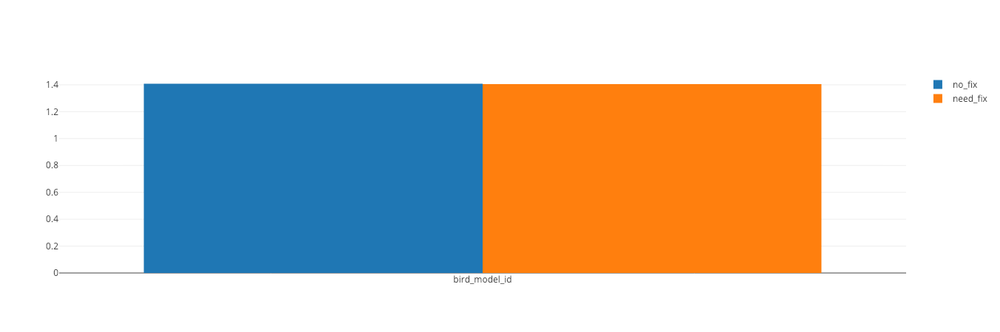

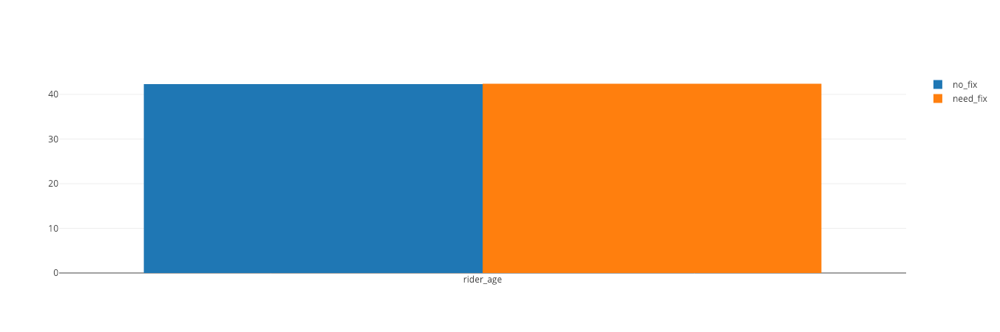

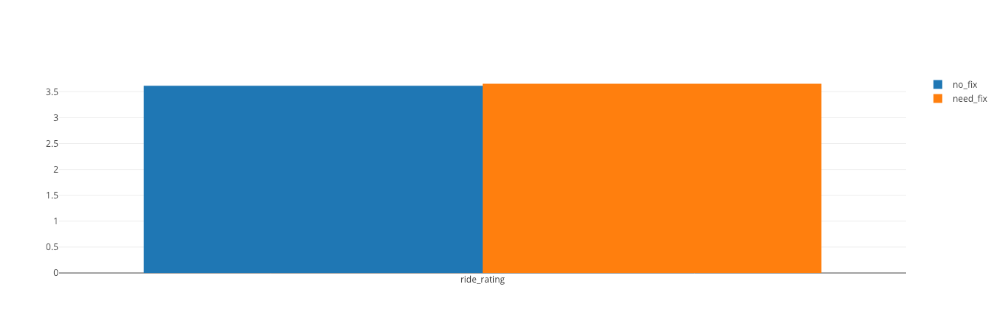

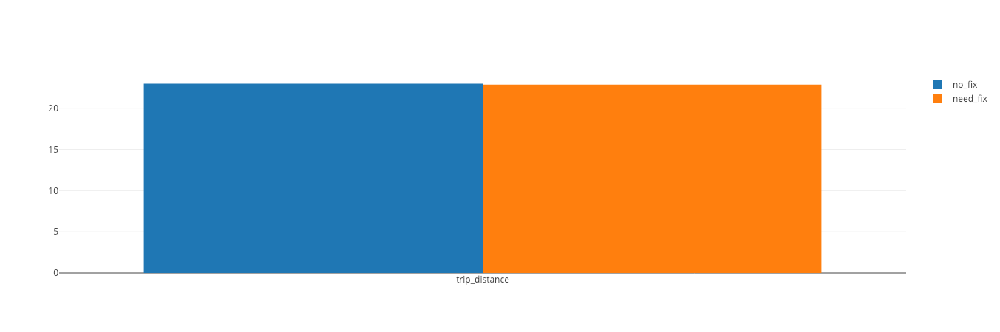

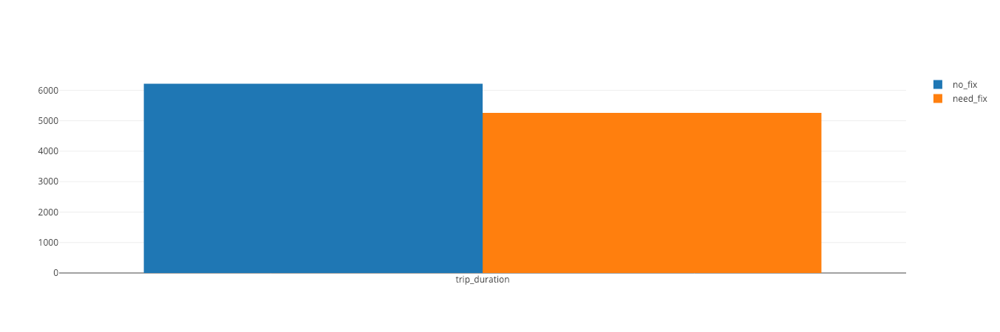

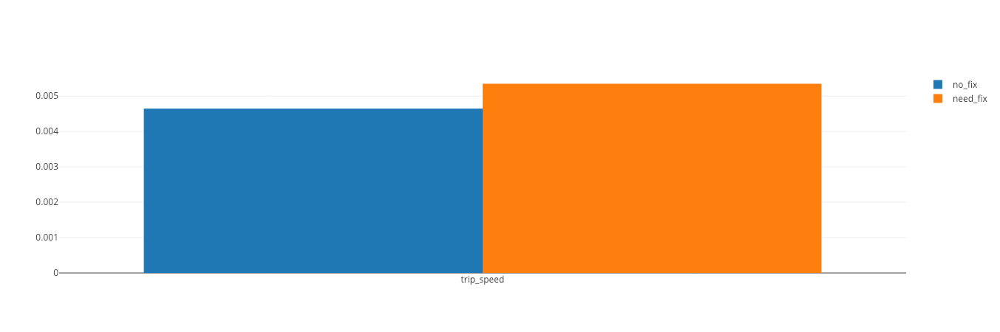

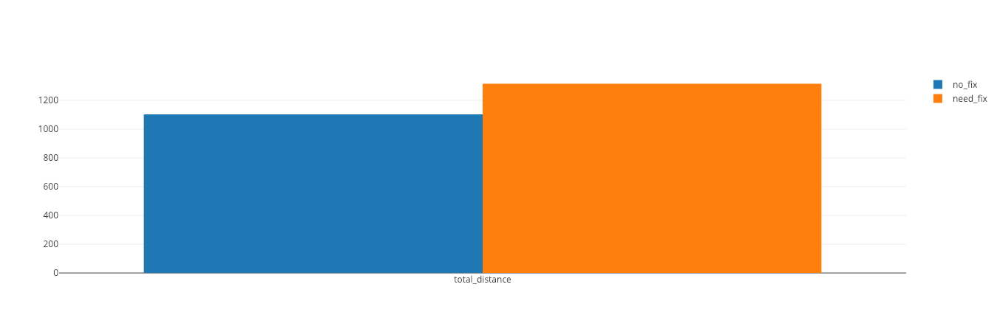

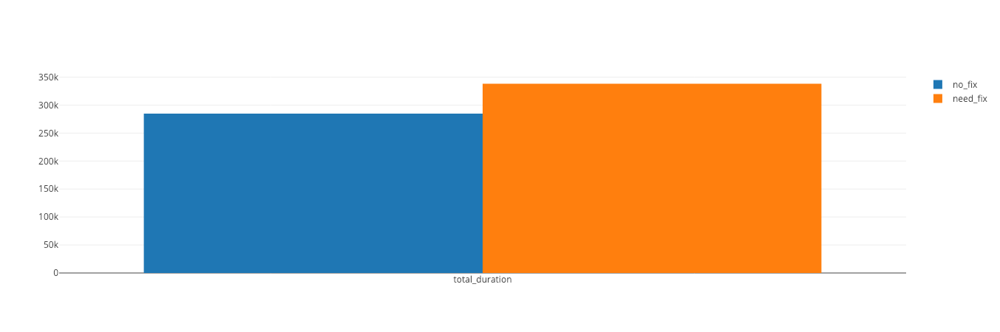

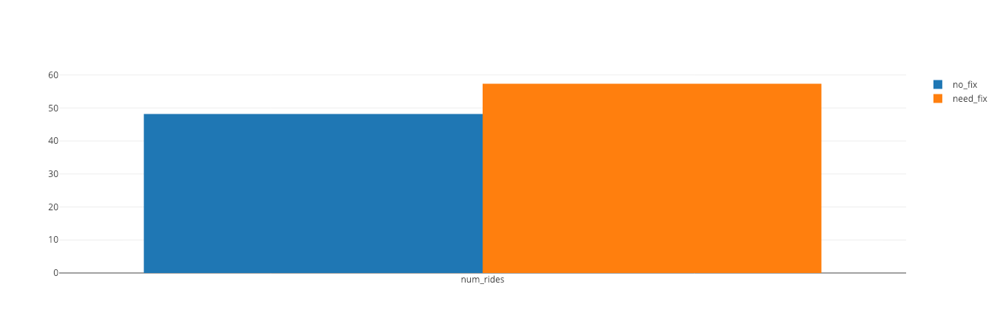

In [12]:
# mean for each numerical category split by fix/not_fix
m = df.groupby('fix').mean()

cats = m.columns

for cat in cats:
    # correlation against fix column 
    trace1 = go.Bar(x=[cat],y=[m[cat][0]],name='no_fix') 
    trace2 = go.Bar(x=[cat],y=[m[cat][1]],name='need_fix')
    data= [trace1,trace2]
    fig = go.Figure(data)
    py.iplot(fig)

# HISTOGRAM

In [13]:
def graph_hist(col):
    trace1 = go.Histogram(x=df[df.fix==0][col],name='No Fixing',opacity=0.75)
    trace2 = go.Histogram(x=df[df.fix==1][col],name='Needs Fixing',opacity=0.75)

    data = [trace1,trace2]
    layout = go.Layout(title=col,barmode='overlay')
    fig = go.Figure(data,layout)
    py.iplot(fig)

In [14]:
columns = df.columns.tolist()

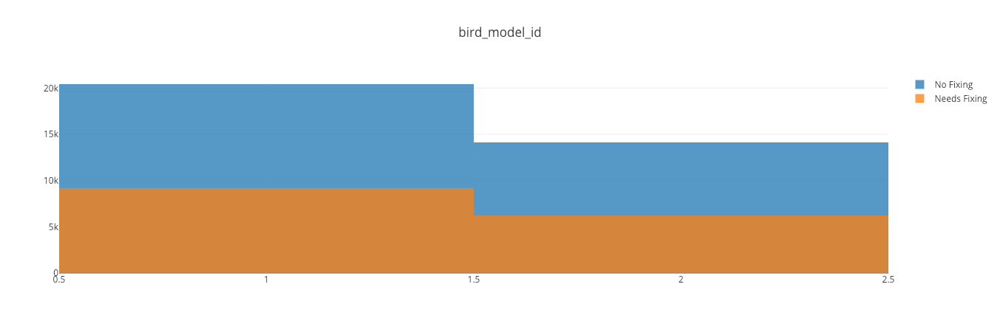

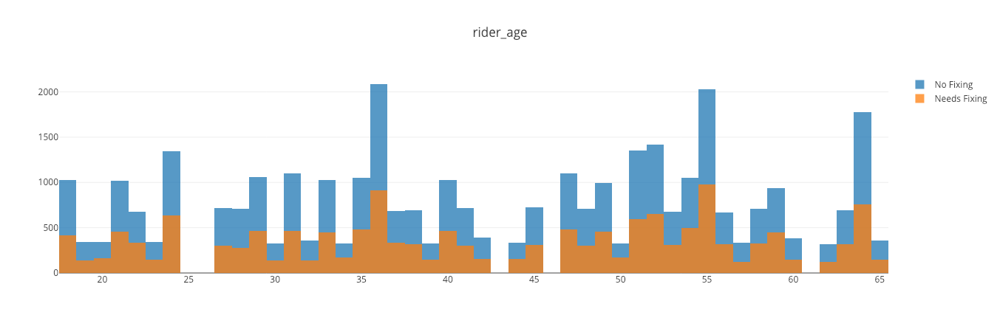

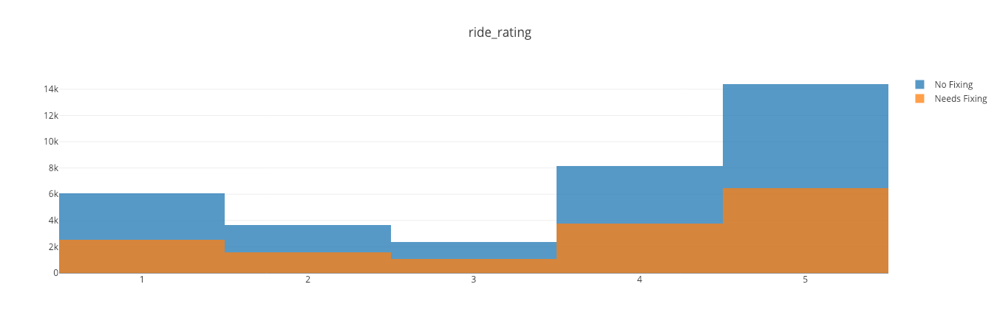

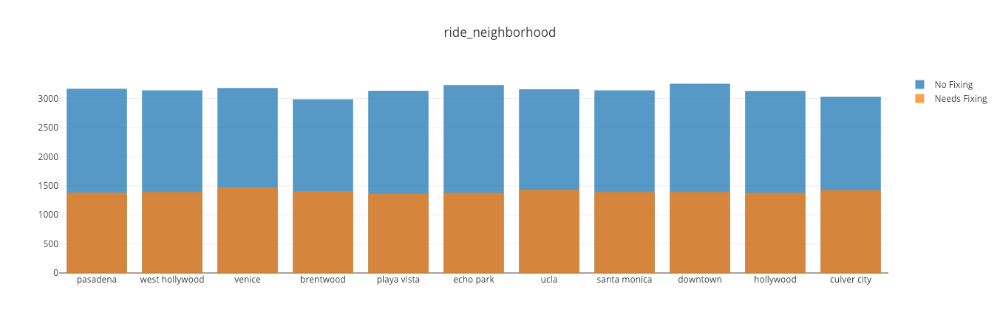

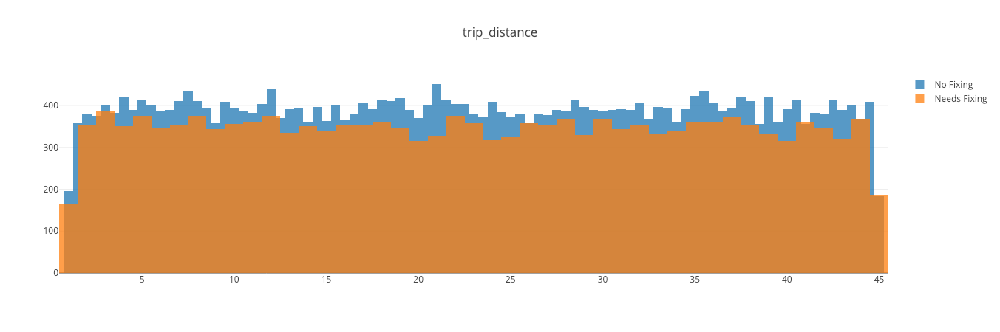

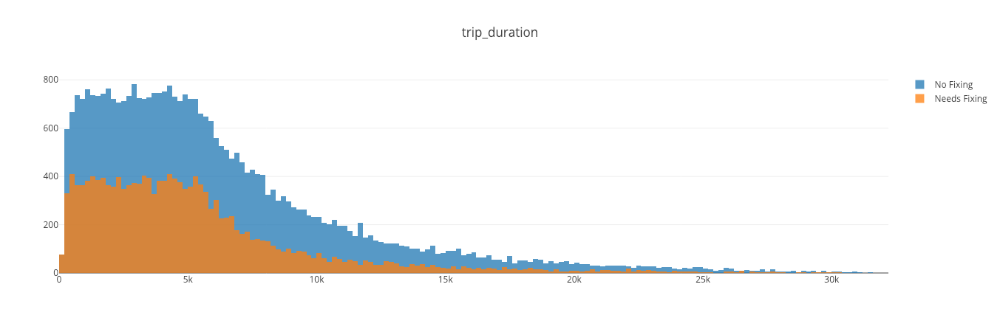

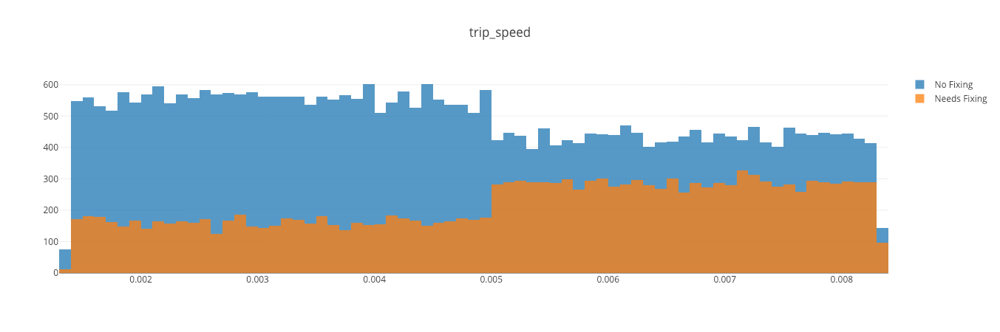

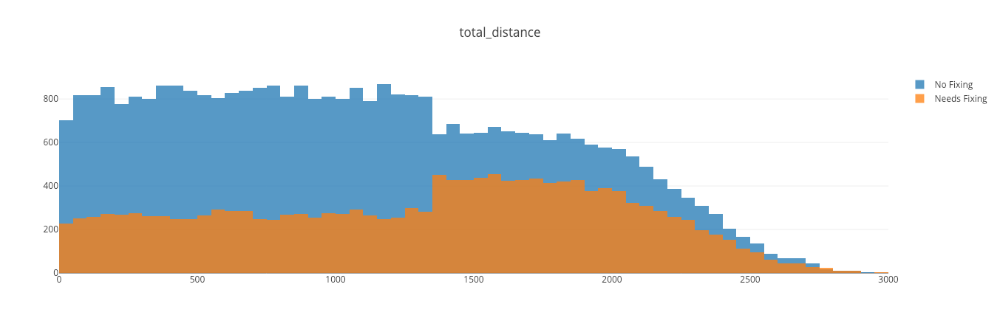

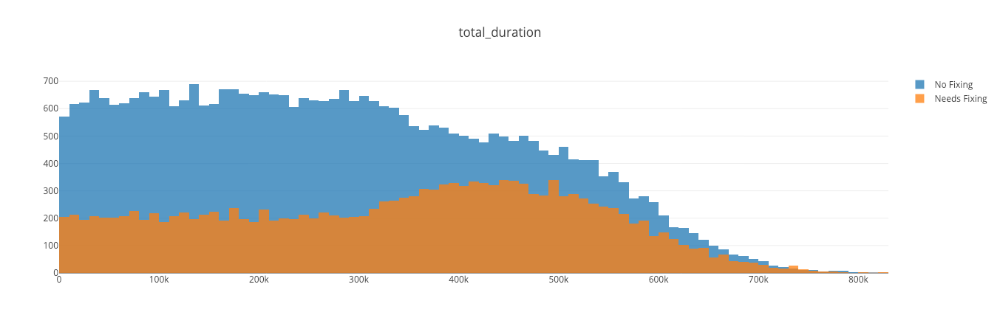

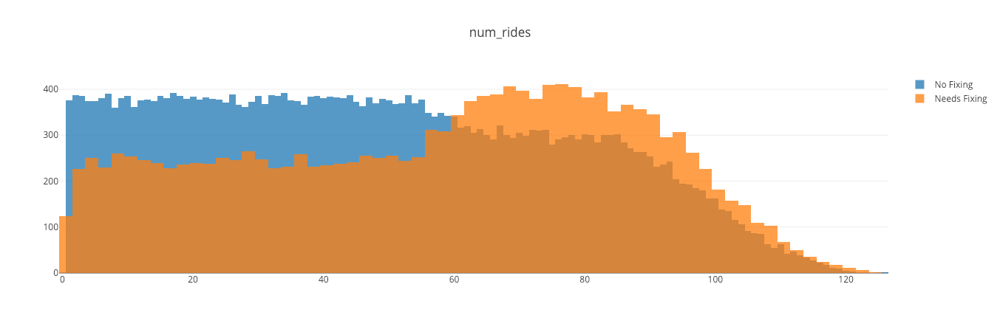

In [15]:
for col in columns:
    graph_hist(col)

# Modeling

In [16]:
# get dummies for categorical variables
cat1 = pd.get_dummies(df.ride_neighborhood)
cat2 = pd.get_dummies(df.bird_model_id,prefix='model')

In [17]:
# numerical variables
num = df.select_dtypes(exclude='object').drop(['bird_model_id'],axis=1)

In [18]:
# combine numerical and dummy cats
df2 = pd.concat([num,cat1,cat2],axis=1)

# Random Forest
- importance of each feature

In [19]:
y = df2.fix
X = df2.drop('fix',axis=1)

In [20]:
from sklearn.ensemble import RandomForestClassifier

# Build the model
rfc = RandomForestClassifier()

# Fit the model
rfc.fit(X,y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [21]:
rfc_features = pd.DataFrame(rfc.feature_importances_,index= X.columns).sort_values([0],ascending=False)

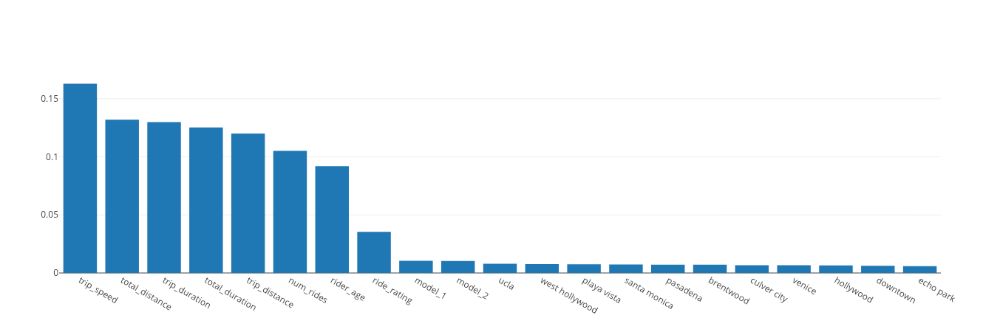

In [22]:
# FEATURES against fix column 
data= [go.Bar(x=rfc_features.index,y=rfc_features[0])]
fig = go.Figure(data)
py.iplot(fig)